### 1- Importing the libraries

In [1]:
import librosa
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np

### 2- Loading Audio Files

In [2]:
# load audio files 
sazzy_file = "sazzy.wav"
dance_file = "dance.wav"

In [3]:
ipd.Audio(dance_file)

In [4]:
ipd.Audio(sazzy_file)

In [5]:
dance, sr = librosa.load(dance_file, )
sazzy , _ = librosa.load(sazzy_file)


In [6]:
dance

array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        5.9389800e-05, -2.4954788e-06, -1.9371952e-04], dtype=float32)

In [7]:
sazzy

array([-2.7533838e-11,  8.6645163e-11,  2.7534511e-10, ...,
       -7.2401898e-09, -9.8923847e-09, -4.1927839e-09], dtype=float32)

In [8]:
dance.size

1388160

In [9]:
len(dance)

1388160

In [10]:
# duration of 1 sample 

sample_duration = 1 / sr
print(f"Duration of 1 sample is : {sample_duration:.6f} seconds")

Duration of 1 sample is : 0.000045 seconds


In [11]:
# Duration of the audio signal in seconds
duration = sample_duration * len(dance)
print(f"the duration is : {duration}")

the duration is : 62.95510204081633


### 3- visualizing the wave form for each audio

(-1.0, 1.0)

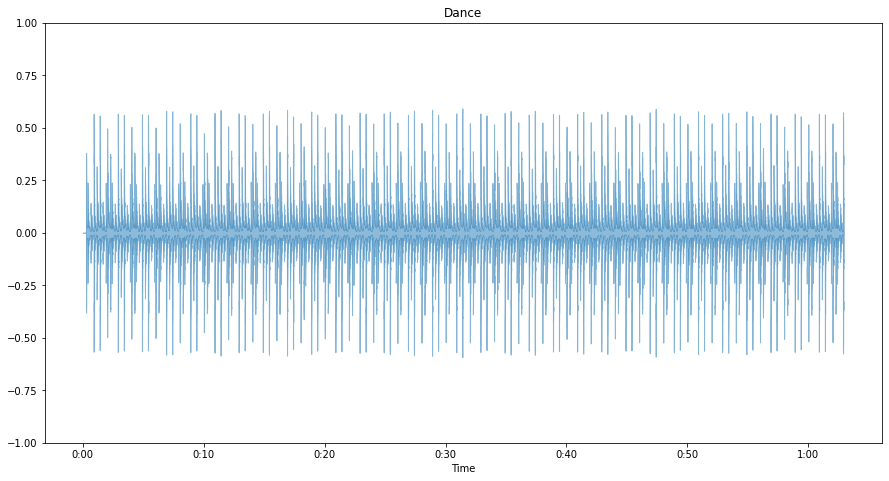

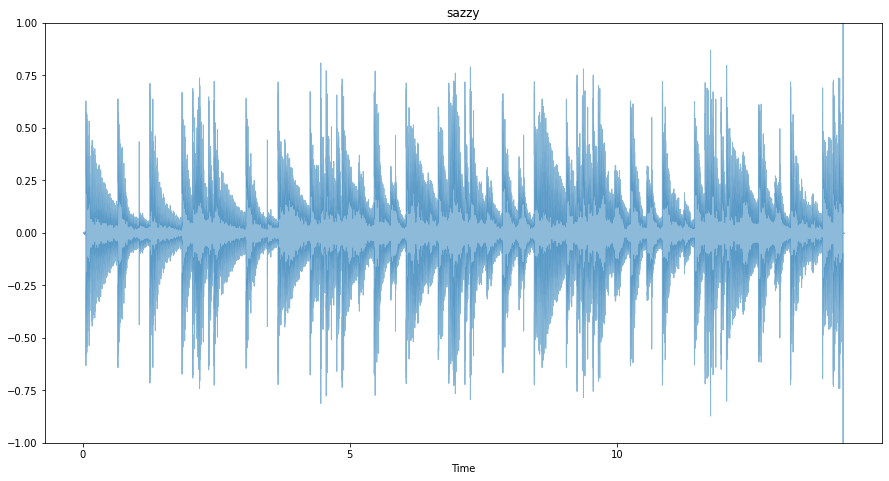

In [12]:
# visualize the waveforms

plt.figure(figsize=(15,17))
plt.subplot(2,1,1)
librosa.display.waveshow(dance, alpha=0.5)
plt.title("Dance")
plt.ylim((-1,1))

plt.figure(figsize=(15,17))
plt.subplot(2,1,2)
librosa.display.waveshow(sazzy, alpha=0.5)
plt.title("sazzy")
plt.ylim((-1,1))



### 4- Extracting the amplitude evelope

In [22]:
# Calculate the amplitude envelope in 2 ways (same algorithm)

# constants
FRAME_SIZE = 1024
HOP_LENGTH = 512

#Calculate the amplitude the traditional way
def amplitude_envelope(signal, frame_size, hop_length):
    amplitude_envelope = []
    
    # Calculate the amplitude Envelope for each frame
    for i in range(0,len(signal),hop_length):
        current_frame_amplitude_envelope = max(signal[i:i+frame_size])
        amplitude_envelope.append(current_frame_amplitude_envelope)
        
    return np.array(amplitude_envelope)

# Calculate the amplitude envelope using list comprehension
def fancy_amplitude_envelope(signal,frame_size, hop_length):
    return np.array([max(signal[i:i+frame_size]) for i in range(0,len(signal),hop_length)])

In [21]:
ae_dance = amplitude_envelope(dance,FRAME_SIZE,HOP_LENGTH)
len(ae_dance)

2712

In [23]:
fancy_ae_dance = fancy_amplitude_envelope(dance,FRAME_SIZE,HOP_LENGTH)

In [24]:
# making sure the two algorithms give the same results
(ae_dance == fancy_ae_dance).all()

True

In [31]:
ae_sazzy = fancy_amplitude_envelope(sazzy, FRAME_SIZE,HOP_LENGTH)

### 5 Visulizing the amplitude envelopes for the audio files

(-1.0, 1.0)

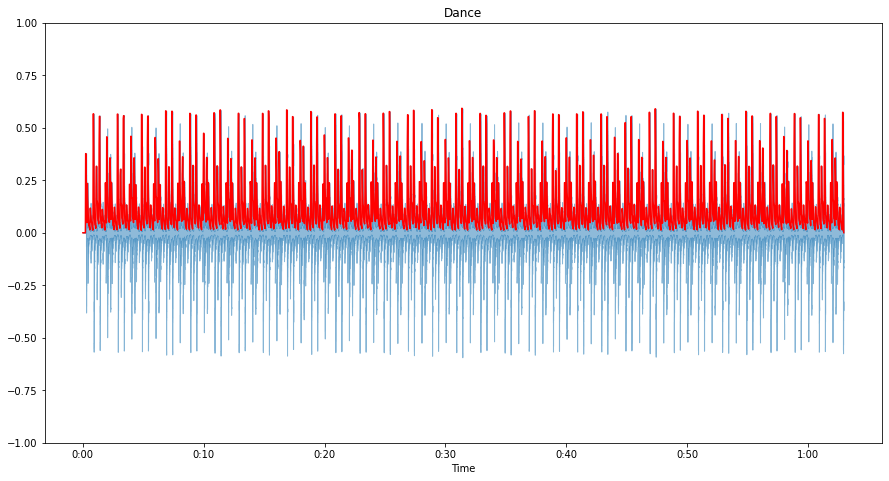

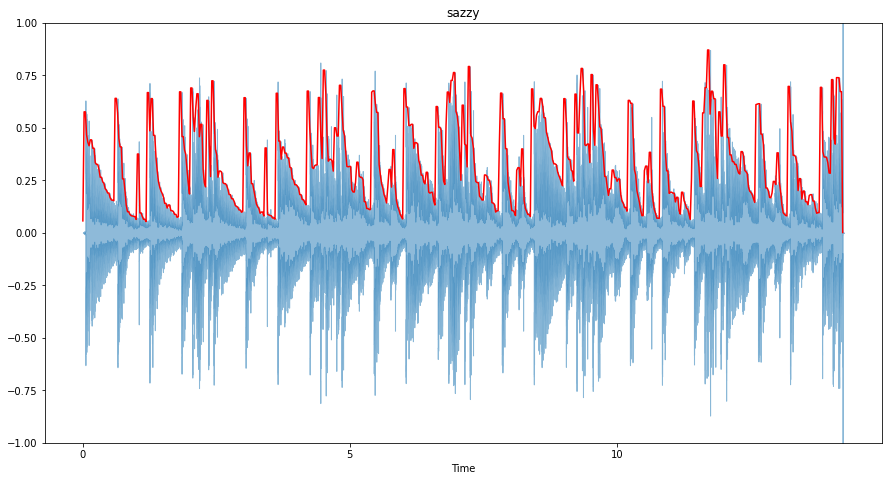

In [28]:
# visualize the amplitude envelopes for all the audio files

frames = range(0,ae_dance.size)
t = librosa.frames_to_time(frames, )

frames1 = range(0,ae_sazzy.size)
t1 = librosa.frames_to_time(frames1, )

plt.figure(figsize=(15,17))
plt.subplot(2,1,1)
librosa.display.waveshow(dance, alpha=0.5)
plt.plot(t,ae_dance,color="r")
plt.title("Dance")
plt.ylim((-1,1))

plt.figure(figsize=(15,17))
plt.subplot(2,1,2)
librosa.display.waveshow(sazzy, alpha=0.5)
plt.plot(t1,ae_sazzy,color="r")
plt.title("sazzy")
plt.ylim((-1,1))

